# COCO sample - animal or person?

In [1]:
import numpy as np
import pandas as pd
import json
import os
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
from skimage.io import imread
import pdb

## 1. 파일 및 이미지 확인

In [2]:
with open('./annotation2.json', 'r') as f:
    annot_data = json.load(f)
    
annot_df = pd.DataFrame(annot_data['annotations'])
annot_df.head()

,id,image_id,category_id,segmentation,area,bbox,iscrowd,attributes
0,1,1,1,"[[288.43, 63.86, 285.32, 64.07, 282.21, 65.1, ...",40558.0,"[212.74, 63.86, 165.89, 486.67]",0,{'occluded': False}
1,2,1,1,"[[103.22, 91.87, 98.74, 93.36, 94.56, 95.45, 9...",19547.0,"[36.33, 90.68, 124.81, 477.45]",0,{'occluded': False}
2,3,2,2,"[[454.7, 0.1, 453.6, 1.2, 453.2, 2.7, 452.4, 4...",6239.0,"[445.1, 0.1, 77.6, 92.2]",0,{'occluded': False}
3,4,2,1,"[[113.09, 119.12, 109.98, 118.91, 106.24, 118....",24236.0,"[10.03, 114.15, 183.93, 224.35]",0,{'occluded': False}
4,5,2,1,"[[544.07, 111.01, 540.84, 113.25, 537.85, 115....",22039.0,"[436.48, 103.54, 190.16, 228.06]",0,{'occluded': False}


In [1]:
from pycocotools.coco import COCO

ModuleNotFoundError: No module named 'pycocotools'

In [3]:
images_df = pd.DataFrame(annot_data['images'])
images_df.head()

,id,width,height,file_name,license,flickr_url,coco_url,date_captured
0,1,425,640,COCO_test2014_000000000202.jpg,0,,,0
1,2,640,427,COCO_test2014_000000000448.jpg,0,,,0
2,3,640,425,COCO_test2014_000000000568.jpg,0,,,0
3,4,640,424,COCO_test2014_000000000840.jpg,0,,,0
4,5,640,427,COCO_test2014_000000000970.jpg,0,,,0


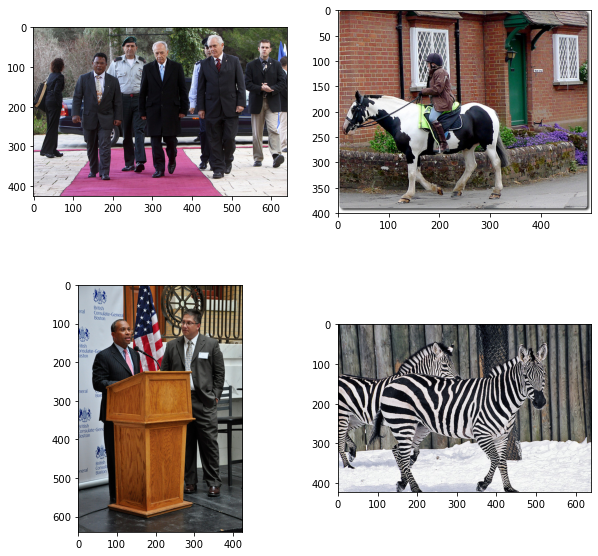

In [4]:
fig, f_ax = plt.subplots(2, 2, figsize=(10, 10))
for ax, (_, row) in zip(f_ax.flatten(), images_df.sample(4).iterrows()):
    img_data = imread(os.path.join('./data/', row['file_name']))
    ax.imshow(img_data)

In [75]:
df = pd.merge(annot_df, images_df, how='left', left_on='image_id', right_on='id')
df.head()

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,width,height,file_name,license,flickr_url,coco_url,date_captured
0,1,1,1,"[[288.43, 63.86, 285.32, 64.07, 282.21, 65.1, ...",40558.0,"[212.74, 63.86, 165.89, 486.67]",0,{'occluded': False},1,425,640,COCO_test2014_000000000202.jpg,0,,,0
1,2,1,1,"[[103.22, 91.87, 98.74, 93.36, 94.56, 95.45, 9...",19547.0,"[36.33, 90.68, 124.81, 477.45]",0,{'occluded': False},1,425,640,COCO_test2014_000000000202.jpg,0,,,0
2,3,2,2,"[[454.7, 0.1, 453.6, 1.2, 453.2, 2.7, 452.4, 4...",6239.0,"[445.1, 0.1, 77.6, 92.2]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
3,4,2,1,"[[113.09, 119.12, 109.98, 118.91, 106.24, 118....",24236.0,"[10.03, 114.15, 183.93, 224.35]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
4,5,2,1,"[[544.07, 111.01, 540.84, 113.25, 537.85, 115....",22039.0,"[436.48, 103.54, 190.16, 228.06]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0


## 2. BBOX

In [79]:
def creat_doxes(in_rows):
    box_list = []
    for _, in_row in in_rows.iterrows():
        left, top, width, high = in_row['bbox']

        # matplotlib의 Rectagle은 ((left, top), width high) 형식
        box_list += [Rectangle((left, top), width, high)]
        
    return box_list

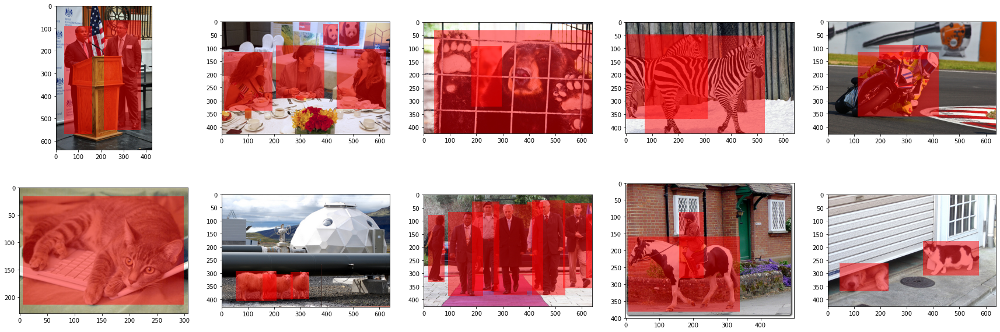

In [97]:
fig, m_axs = plt.subplots(2, 5, figsize=(30, 10))

for c_ax, (c_id, c_df) in zip(m_axs.flatten(), df.groupby('image_id')):
    img_data = imread(os.path.join('./data/', c_df['file_name'].values[0]))
    c_ax.imshow(img_data)
    c_ax.add_collection(PatchCollection(creat_doxes(c_df), alpha = 0.5, facecolors='red')) #alpha 투명도

## 3. Polygons

In [67]:
from matplotlib.path import Path
from skimage.color import label2rgb

In [68]:
def rows_to_segmentation(in_img, in_df):
    xx, yy = np.meshgrid(range(in_img.shape[0]),
                         range(in_img.shape[1]),
                         indexing='ij')
    out_img = np.zeros(in_img.shape[:2])
    
    for _, c_row in in_df.iterrows():
        xy_vec = np.array(c_row['segmentation']).reshape((-1,2))
        c_ax.plot(xy_vec[:, 0], xy_vec[:, 1], label = c_df['id_x'])
        xy_path = Path(xy_vec)
        out_img += xy_path.contains_points(np.stack([yy.ravel(), xx.ravel()], -1)).reshape(out_img.shape)
        
    return out_img

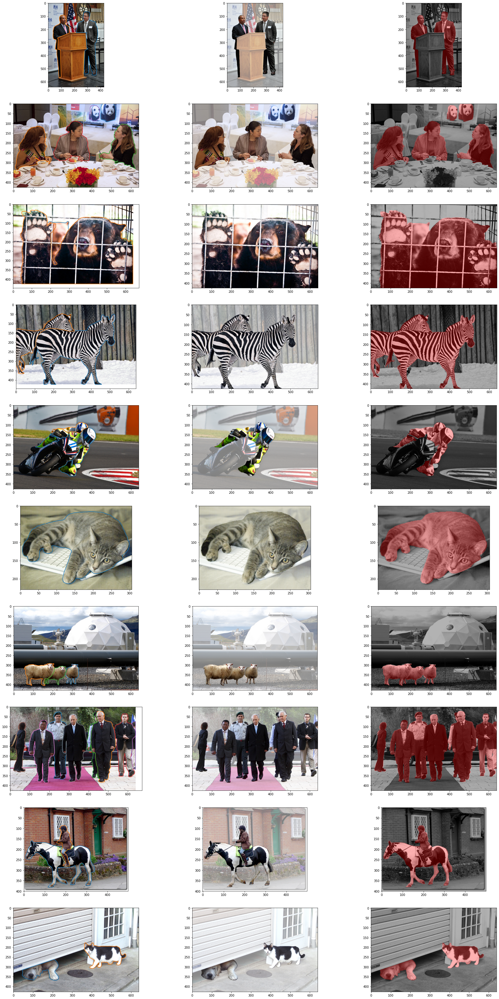

In [71]:
fig, m_axs = plt.subplots(10, 3, figsize=(30, 60))

for (c_ax, d_ax, f_ax), (c_id, c_df) in zip(m_axs, df.groupby('image_id')):
    img_data = imread(os.path.join('./data', c_df['file_name'].values[0]))
    c_ax.imshow(img_data) # 첫번째 테두리만
    
    out_img = rows_to_segmentation(img_data, c_df)
    rgba_img = np.concatenate([img_data, np.clip(np.expand_dims(127*out_img+127, -1), 0, 255).astype(np.uint8)], -1)
    d_ax.imshow(rgba_img) # 두번째 배경 흐리게
    f_ax.imshow(label2rgb(image=img_data, label=out_img, bg_label=0)) # 세번째 color

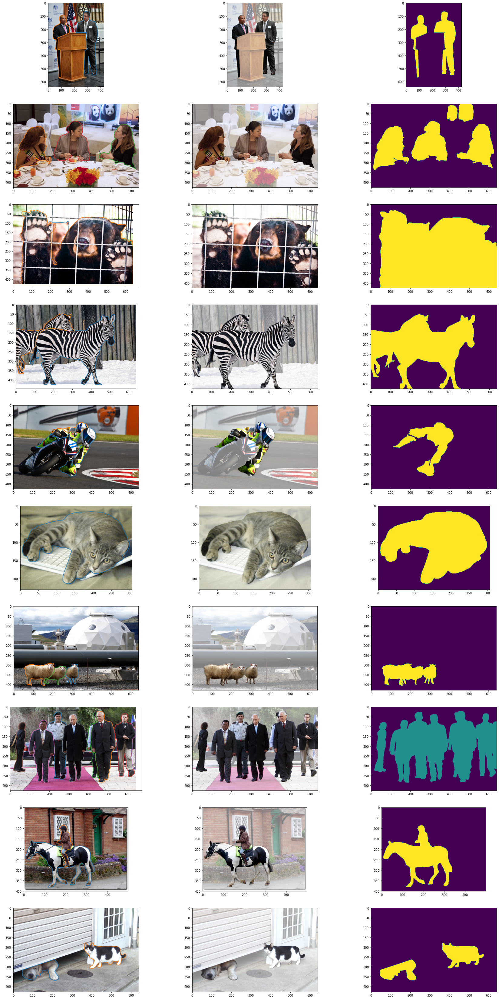

In [21]:
fig, m_axs = plt.subplots(10, 3, figsize=(30, 60))

for (c_ax, d_ax, f_ax), (c_id, c_df) in zip(m_axs, df.groupby('image_id')):
    img_data = imread(os.path.join('./data', c_df['file_name'].values[0]))
    c_ax.imshow(img_data) # 첫번째 테두리만
    
    out_img = rows_to_segmentation(img_data, c_df)
    rgba_img = np.concatenate([img_data, np.clip(np.expand_dims(127*out_img+127, -1), 0, 255).astype(np.uint8)], -1)
    d_ax.imshow(rgba_img) # 두번째 배경 흐리게
    f_ax.imshow(out_img) # 세번째 color
    

In [25]:
from mrcnn import visualize
img_data = imread(os.path.join('./data', df['file_name'].values[0]))
# plt.imshow(img_data)
visualize.display_instances(img_data, df['segmentation'], df['category_id'], df['id_x'])

ModuleNotFoundError: No module named 'mrcnn'

In [22]:
df['file_name'].values[0]

'COCO_test2014_000000000202.jpg'

In [11]:
df

,id_x,image_id,category_id,segmentation,area,bbox,iscrowd,attributes,id_y,width,height,file_name,license,flickr_url,coco_url,date_captured
0,1,1,1,"[[288.43, 63.86, 285.32, 64.07, 282.21, 65.1, ...",40558.0,"[212.74, 63.86, 165.89, 486.67]",0,{'occluded': False},1,425,640,COCO_test2014_000000000202.jpg,0,,,0
1,2,1,1,"[[103.22, 91.87, 98.74, 93.36, 94.56, 95.45, 9...",19547.0,"[36.33, 90.68, 124.81, 477.45]",0,{'occluded': False},1,425,640,COCO_test2014_000000000202.jpg,0,,,0
2,3,2,2,"[[454.7, 0.1, 453.6, 1.2, 453.2, 2.7, 452.4, 4...",6239.0,"[445.1, 0.1, 77.6, 92.2]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
3,4,2,1,"[[113.09, 119.12, 109.98, 118.91, 106.24, 118....",24236.0,"[10.03, 114.15, 183.93, 224.35]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
4,5,2,1,"[[544.07, 111.01, 540.84, 113.25, 537.85, 115....",22039.0,"[436.48, 103.54, 190.16, 228.06]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
5,6,2,1,"[[315.02, 89.03, 312.72, 88.74, 310.56, 88.88,...",24571.0,"[205.64, 88.74, 183.95, 203.13]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
6,7,2,2,"[[405.26, 8.31, 403.66, 8.51, 402.16, 8.91, 40...",3556.0,"[385.66, 8.11, 55.0, 80.0]",0,{'occluded': False},2,640,427,COCO_test2014_000000000448.jpg,0,,,0
7,8,3,2,"[[182.08, 101.77, 181.33, 114.45, 186.55, 111....",11583.0,"[181.33, 91.45, 115.91, 230.28]",0,{'occluded': False},3,640,425,COCO_test2014_000000000568.jpg,0,,,0
8,9,3,2,"[[407.62, 69.34, 402.03, 68.97, 395.32, 68.97,...",187897.0,"[40.41, 30.94, 599.47, 393.69]",0,{'occluded': False},3,640,425,COCO_test2014_000000000568.jpg,0,,,0
9,10,4,2,"[[482.29, 62.76, 477.46, 65.73, 472.25, 63.5, ...",77043.0,"[72.8, 50.11, 454.87, 373.89]",0,{'occluded': False},4,640,424,COCO_test2014_000000000840.jpg,0,,,0
